In [48]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker
import os,random
import cv2
import csv

from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import pickle

In [2]:
#load image data from file and labels
#load labels
# define 8 kind of emotion,defined as one hot label
# anger-1    contempt-2    disgust-3   fear-4   happiness-5   neutral-6     sadness-7    surprise-8
def labelconvert():
    csv_file=csv.reader(open('train.csv','r'))
    x=list(csv_file)
    length=len(x)
    onehot_labels=np.zeros((length,8))
    labels=np.zeros((length))
    for i in range (0,len(x)):
        if (x[i][1]=='anger'):
            onehot_labels[i][0]=1
            labels[i]=0
        elif (x[i][1]=='contempt'):
            onehot_labels[i][1]=1
            labels[i]=1
        elif (x[i][1]=='disgust'):
            onehot_labels[i][2]=1
            labels[i]=2
        elif (x[i][1]=='fear'):
            onehot_labels[i][3]=1
            labels[i]=3
        elif (x[i][1]=='happiness'):
            onehot_labels[i][4]=1
            labels[i]=4
        elif (x[i][1]=='neutral'):
            onehot_labels[i][5]=1
            labels[i]=5
        elif (x[i][1]=='sadness'):
            onehot_labels[i][6]=1
            labels[i]=6
        elif (x[i][1]=='surprise'):
            onehot_labels[i][7]=1
            labels[i]=7
        else:
            labels[i]=0
    return onehot_labels,labels

#load images data
DATA_DIR='C:\\Users\\zhang\\Desktop\\EE599 coding\\HW4\\train_image\\'

ROWS = 224
COLS = 224
CHANNELS = 1

all_images = [DATA_DIR+i for i in os.listdir(DATA_DIR)] # use this for full dataset
#test_images =  [DATA_DIR+i for i in os.listdir(DATA_DIR) if i>=10000]


def read_image(file_path):
    img = cv2.imread(file_path,cv2.IMREAD_GRAYSCALE) #cv2.IMREAD_GRAYSCALE
    return cv2.resize(img, (ROWS, COLS), interpolation=cv2.INTER_CUBIC)

def prep_data(images):
    count = len(images)
    data = np.ndarray((count,  ROWS, COLS), dtype=np.uint8)

    for i, image_file in enumerate(images):
        image = read_image(image_file)
        data[i] = image
        if i%2000 == 0: print('Processed {} of {}'.format(i, count))
    
    return data

# get all data and labels, image data in 'data' array ,onehot labels in 'labels', number labels in 'num_labels'
########################################################################################
                                                                    ###########
data= prep_data(all_images)                                         ###########
labels,num_labels=labelconvert()                                    ###########
                                                                    ###########
########################################################################################

print("Data shape: {}".format(data.shape))

Processed 0 of 12993
Processed 2000 of 12993
Processed 4000 of 12993
Processed 6000 of 12993
Processed 8000 of 12993
Processed 10000 of 12993
Processed 12000 of 12993
Data shape: (12993, 224, 224)


In [3]:
# show image
anger= np.array([1,0,0,0,0,0,0,0])
contempt= np.array([0,1,0,0,0,0,0,0])    
disgust= np.array([0,0,1,0,0,0,0,0])   
fear= np.array([0,0,0,1,0,0,0,0])    
happiness= np.array([0,0,0,0,1,0,0,0])    
neutral= np.array([0,0,0,0,0,1,0,0])      
sadness= np.array([0,0,0,0,0,0,1,0])     
surprise= np.array([0,0,0,0,0,0,0,1]) 

# show face in datase
def show_face(data):
    img = data.reshape(224,224)
    plt.imshow(img,cmap='gray')
    plt.show()

# show label name of label
def show_label(label_test):    
    if (label_test==anger).all():
        print('anger')
    elif (label_test==contempt).all():
        print('contempt')
    elif (label_test==disgust).all():
        print('disgust')
    elif (label_test==fear).all():
        print('fear')
    elif (label_test==happiness).all():
        print('happiness')
    elif (label_test==neutral).all():
        print('neutral')
    elif (label_test==sadness).all():
        print('sadness')
    elif (label_test==surprise).all():
        print('surprise')
    else:
        print('error')
### get all datas in (data), all onehot labels in (labels)  ###

In [4]:
labels.sum(axis=0)
### from the data we find that 1,2,3,4,7,8 class are less than 5,6, among them, 2,4 are far less.
### to overcome inbalance data, we generate 1,3,7,8 each image into 20 other image, and we generate 2,4 each into 200 image.

array([ 239.,    8.,  197.,   19., 5408., 6520.,  253.,  349.])

In [41]:
## seperate each label
# anger-1    contempt-2    disgust-3   fear-4   happiness-5   neutral-6     sadness-7    surprise-8
def data_seperate(input_data,input_labels):
    seperated_data=()
    anger=np.zeros((1,224,224),float)
    contempt=np.zeros((1,224,224),float)
    disgust=np.zeros((1,224,224),float)
    fear=np.zeros((1,224,224),float)
    happiness=np.zeros((1,224,224),float)
    neutral=np.zeros((1,224,224),float)
    sadness=np.zeros((1,224,224),float)
    surprise=np.zeros((1,224,224),float)
    sign=np.zeros(8,int)
    for i in range (0,input_data.shape[0]):
        num_label=max( (v, j) for j, v in enumerate(input_labels[i]) )[1]
        if num_label==0:
            if sign[0]==0:
                anger=input_data[i].reshape(1,224,224)
                sign[0]=1
            else:
                anger=np.vstack([anger,input_data[i].reshape(1,224,224)])
        elif num_label==1:
            if sign[1]==0:
                contempt=input_data[i].reshape(1,224,224)
                sign[1]=1
            else:
                contempt=np.vstack([contempt,input_data[i].reshape(1,224,224)])
        elif num_label==2:
            if sign[2]==0:
                disgust=input_data[i].reshape(1,224,224)
                sign[2]=1
            else:
                disgust=np.vstack([disgust,input_data[i].reshape(1,224,224)])
        elif num_label==3:
            if sign[3]==0:
                fear=input_data[i].reshape(1,224,224)
                sign[3]=1
            else:
                fear=np.vstack([fear,input_data[i].reshape(1,224,224)])
        elif num_label==4:
            if (sign[4]==0):
                happiness=input_data[i].reshape(1,224,224)
                sign[4]=1
            else:
                happiness=np.vstack([happiness,input_data[i].reshape(1,224,224)])
        elif num_label==5:
            if sign[5]==0:
                neutral=input_data[i].reshape(1,224,224)
                sign[5]=1
            else:
                neutral=np.vstack([neutral,input_data[i].reshape(1,224,224)])
        elif num_label==6:
            if sign[6]==0:
                sadness=input_data[i].reshape(1,224,224)
                sign[6]=1
            else:
                sadness=np.vstack([sadness,input_data[i].reshape(1,224,224)])
        elif num_label==7:
            if sign[7]==0:
                surprise=input_data[i].reshape(1,224,224)
                sign[7]=1
            else:
                surprise=np.vstack([surprise,input_data[i].reshape(1,224,224)])
        else:
            print('an error occur in seperated labels')    
        if i%2000 == 0: print('Processed {} of data'.format(i))
    seperated_data=(anger,contempt,disgust, fear, happiness, neutral, sadness, surprise)
    print('finished')
    return seperated_data

In [42]:
#sep=data_seperate(data,labels)
with open('sep.txt', 'wb') as f:
    pickle.dump(sep,f)

Processed 0 of data
Processed 2000 of data
Processed 4000 of data
Processed 6000 of data
Processed 8000 of data
Processed 10000 of data
Processed 12000 of data


In [68]:
with open('sep.txt', 'rb') as fp:   # Unpickling
    read_data = pickle.load(fp)

In [73]:
read_data[2].shape

(197, 224, 224)

In [78]:
#use some data as an example to begain generating
anger=read_data[0]
contempt=read_data[1]    
disgust=read_data[2]   
fear=read_data[3]   
happiness=read_data[4]   
neutral=read_data[5]     
sadness=read_data[6]    
surprise=read_data[7]


(349, 224, 224)

In [80]:
def data_gene(data,num,name):
    datagen = ImageDataGenerator(
            rotation_range=30,
            width_shift_range=0.1,
            height_shift_range=0.1,
            shear_range=0.1,
            horizontal_flip=True,
            fill_mode='nearest')

    img = data.reshape(224,224)  # this is a PIL image
    x = img_to_array(img)  # this is a Numpy array with shape (3, 150, 150)
    x = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 150, 150)

# the .flow() command below generates batches of randomly transformed images
# and saves the results to the `preview/` directory
    i = 0
    for batch in datagen.flow(x, batch_size=1,
                              save_to_dir='data_gene', save_prefix=name, save_format='jpeg'):
        i += 1
        if i > num:
            break  # otherwise the generator would loop indefinitely

In [81]:
def prep_genedata():
    for i in range (0,anger.shape[0]):
        data_gene(anger[i],20,'anger')
    
    return gene_data,gene_labels
    

In [ ]:
def data_mix(data,labels,gene_data,gene_labels,num_data)  #

Epoch 0


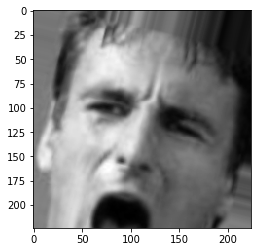

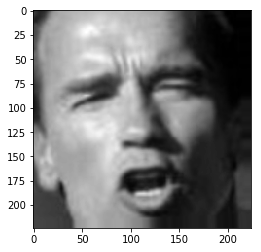

(32, 224, 224, 1)


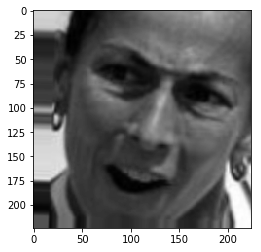

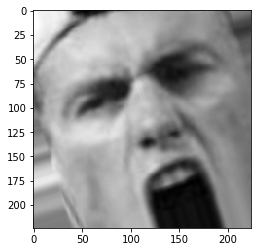

(32, 224, 224, 1)


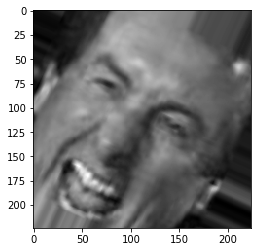

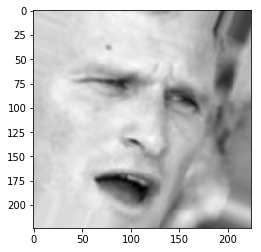

(32, 224, 224, 1)


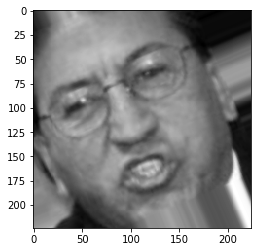

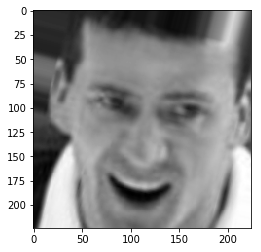

(32, 224, 224, 1)


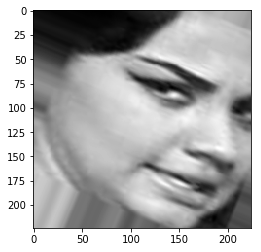

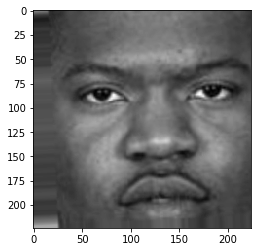

(32, 224, 224, 1)


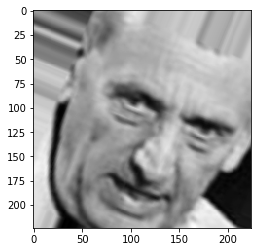

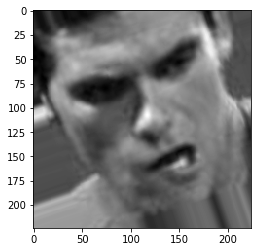

(32, 224, 224, 1)


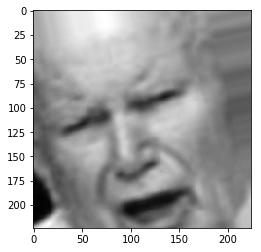

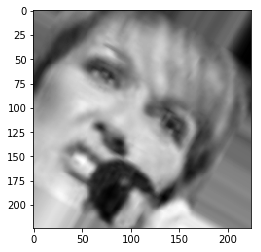

(32, 224, 224, 1)


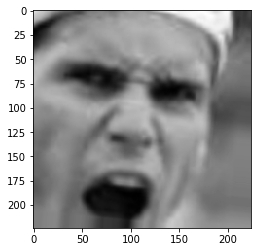

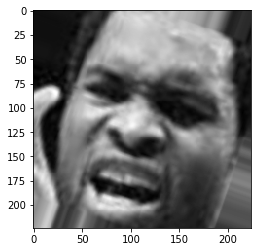

(15, 224, 224, 1)


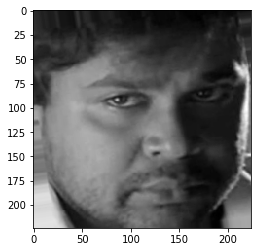

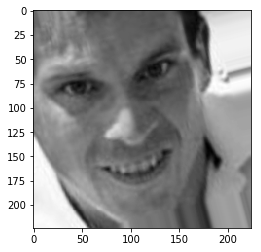

(32, 224, 224, 1)


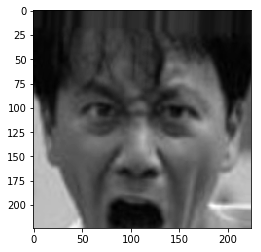

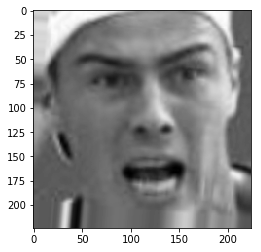

(32, 224, 224, 1)


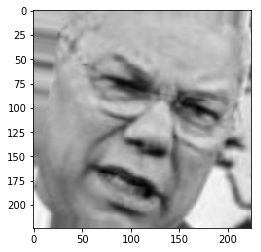

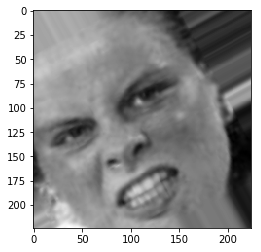

(32, 224, 224, 1)


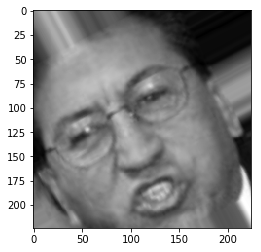

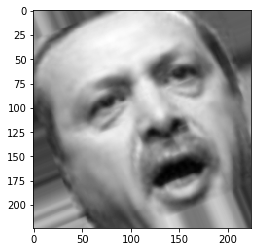

(32, 224, 224, 1)


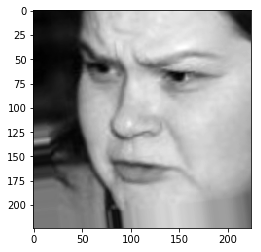

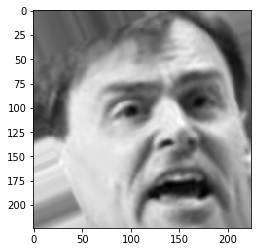

(32, 224, 224, 1)


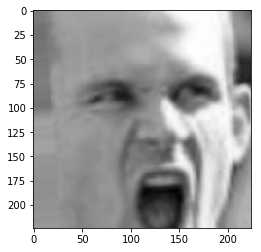

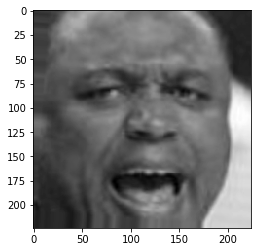

(32, 224, 224, 1)


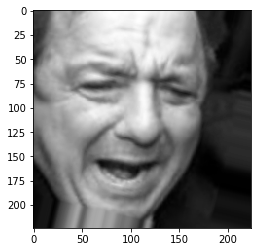

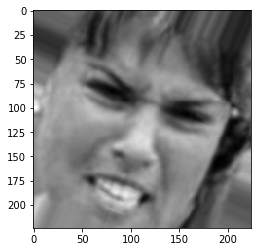

(32, 224, 224, 1)
Epoch 1


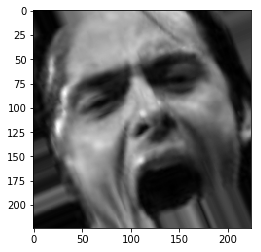

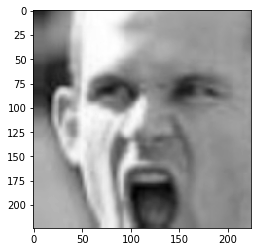

(32, 224, 224, 1)


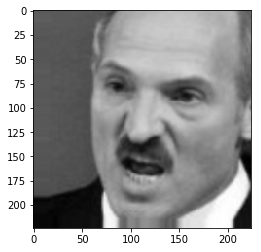

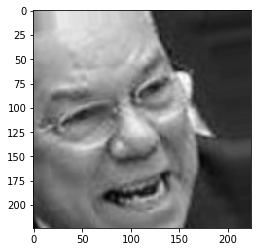

(32, 224, 224, 1)


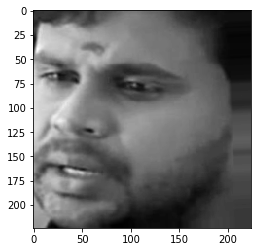

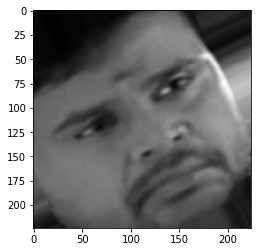

(32, 224, 224, 1)


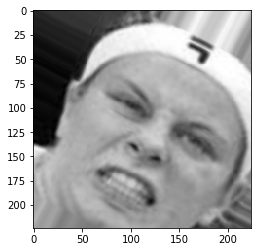

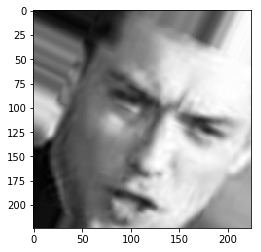

(32, 224, 224, 1)


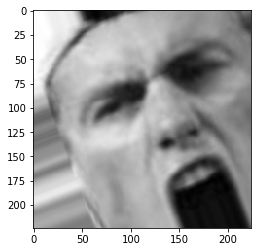

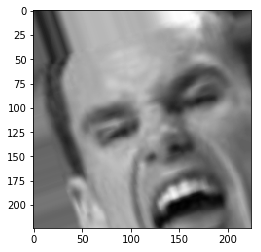

(32, 224, 224, 1)


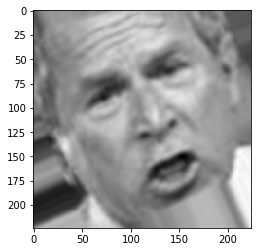

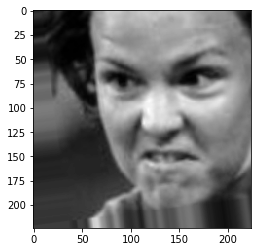

(32, 224, 224, 1)


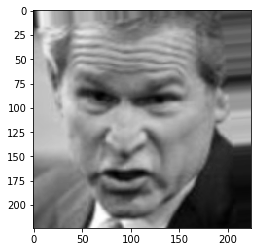

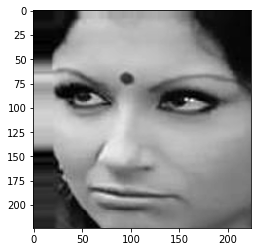

(32, 224, 224, 1)


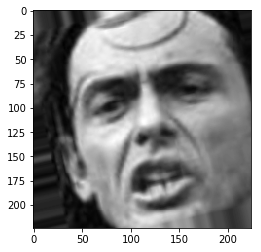

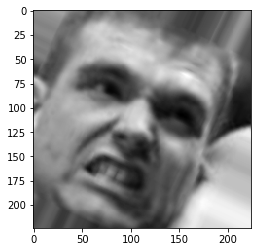

(15, 224, 224, 1)


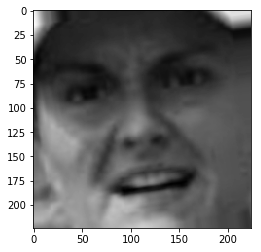

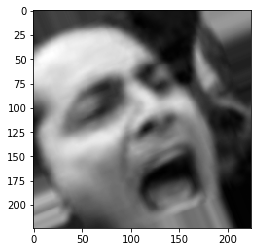

(32, 224, 224, 1)


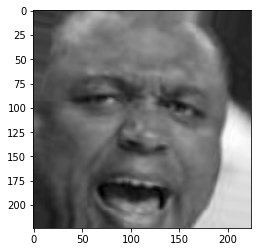

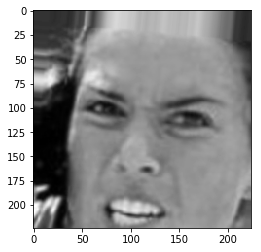

(32, 224, 224, 1)


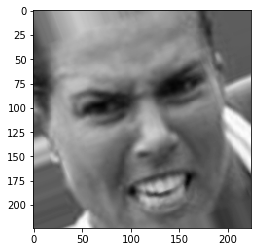

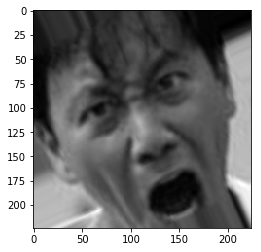

(32, 224, 224, 1)


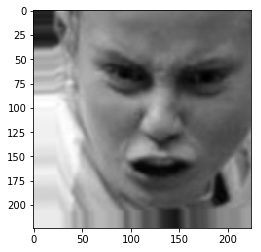

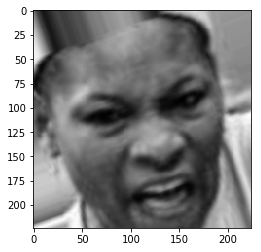

(32, 224, 224, 1)


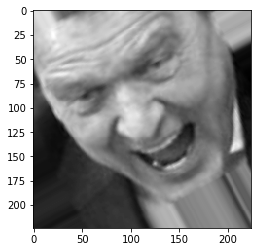

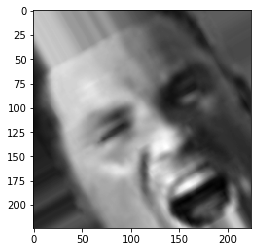

(32, 224, 224, 1)


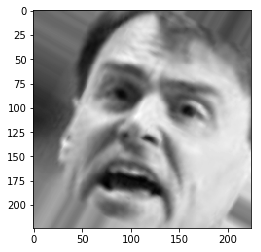

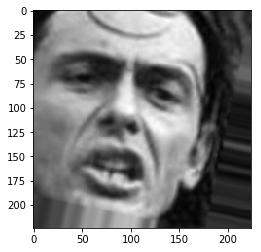

(32, 224, 224, 1)


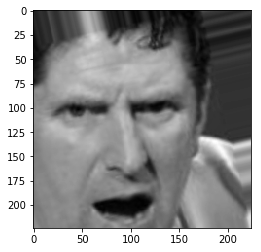

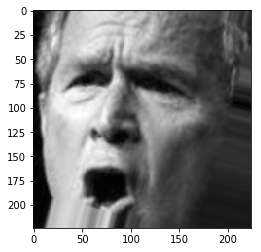

(32, 224, 224, 1)
Epoch 2


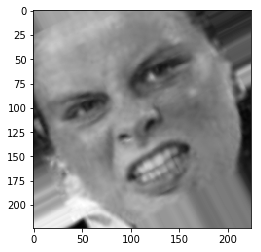

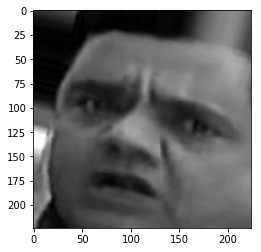

(32, 224, 224, 1)


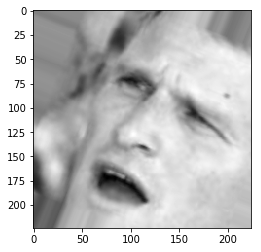

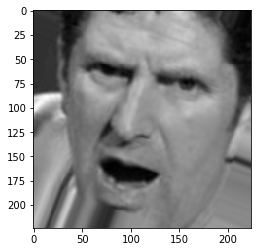

(32, 224, 224, 1)


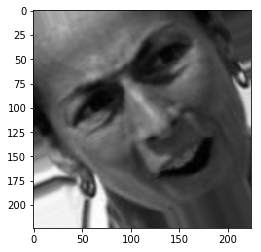

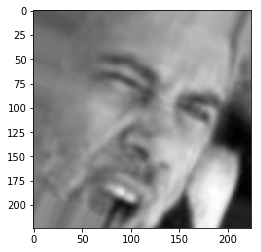

(32, 224, 224, 1)


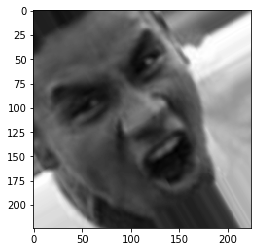

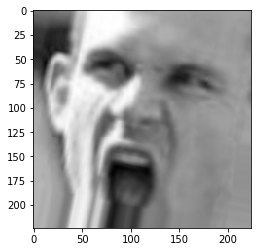

(32, 224, 224, 1)


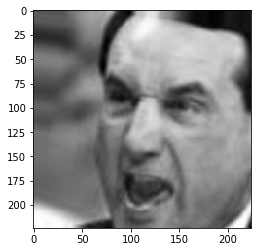

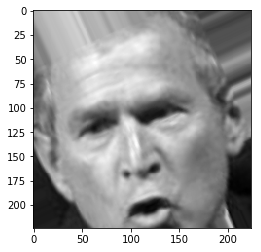

(32, 224, 224, 1)


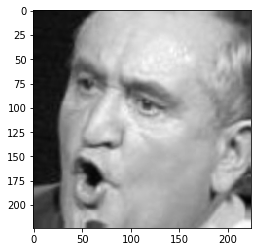

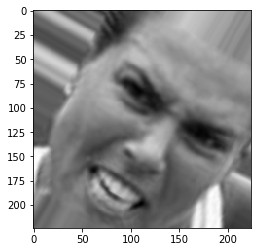

(32, 224, 224, 1)


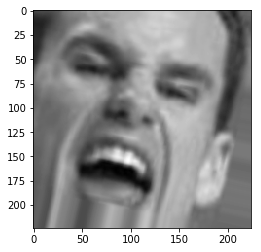

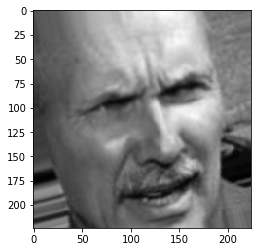

(32, 224, 224, 1)


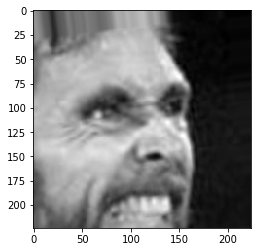

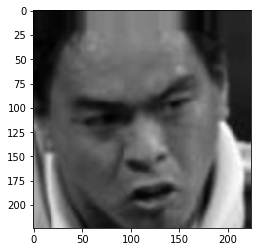

(15, 224, 224, 1)


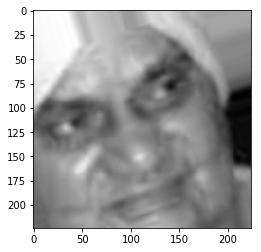

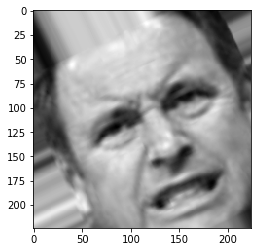

(32, 224, 224, 1)


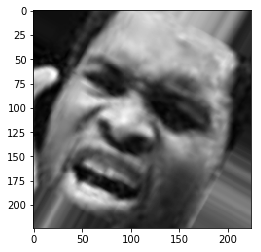

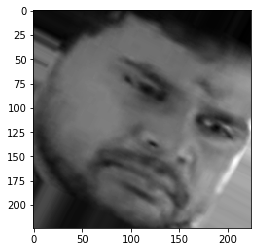

(32, 224, 224, 1)


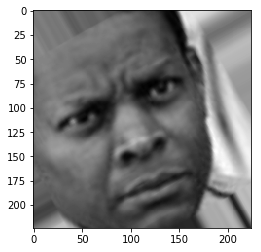

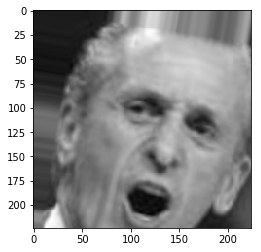

(32, 224, 224, 1)


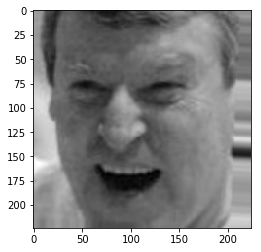

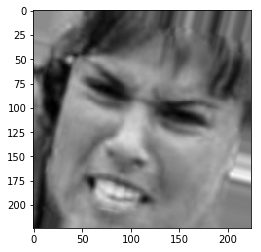

(32, 224, 224, 1)


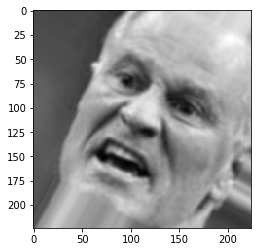

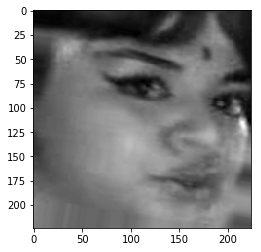

(32, 224, 224, 1)


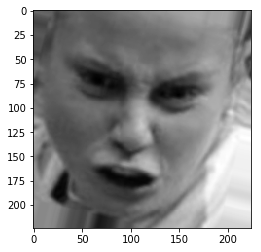

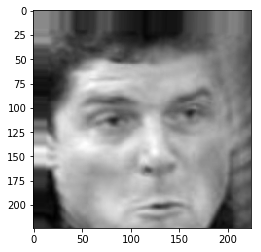

(32, 224, 224, 1)


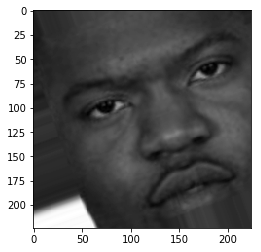

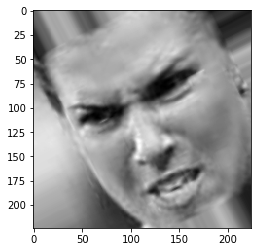

(32, 224, 224, 1)
Epoch 3


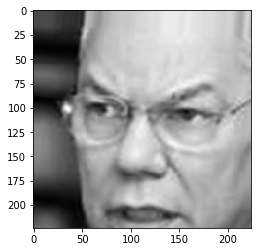

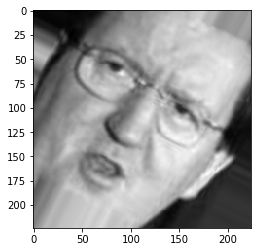

(32, 224, 224, 1)


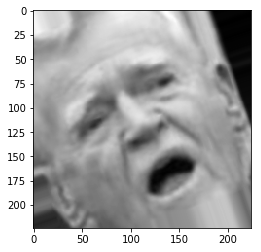

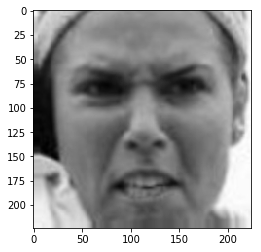

(32, 224, 224, 1)


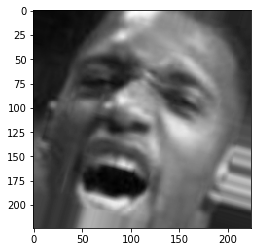

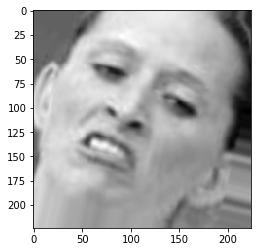

(32, 224, 224, 1)


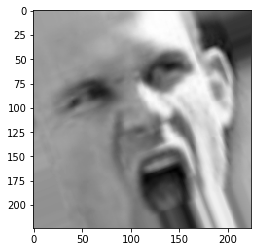

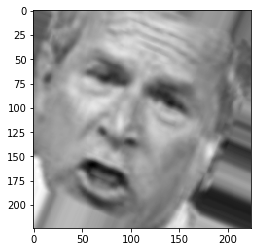

(32, 224, 224, 1)


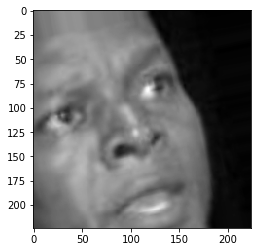

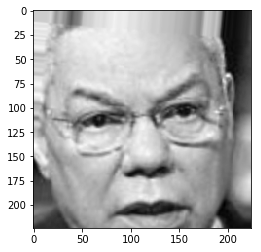

(32, 224, 224, 1)


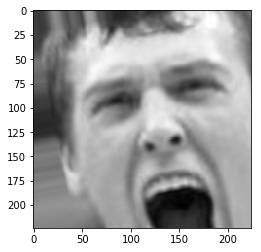

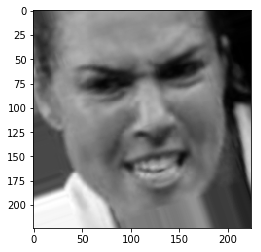

(32, 224, 224, 1)


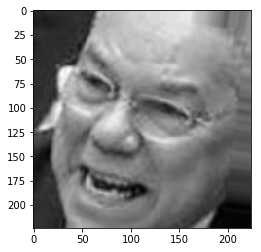

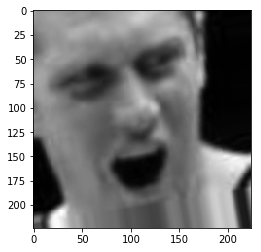

(32, 224, 224, 1)


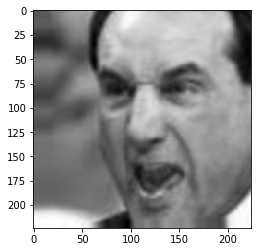

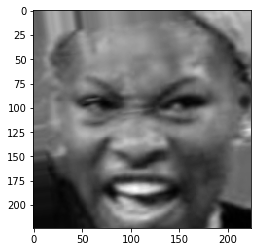

(15, 224, 224, 1)


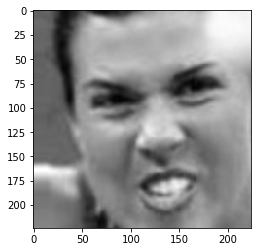

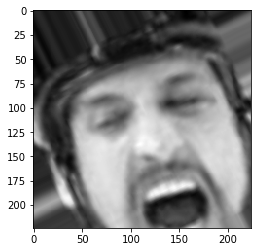

(32, 224, 224, 1)


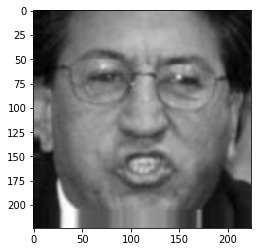

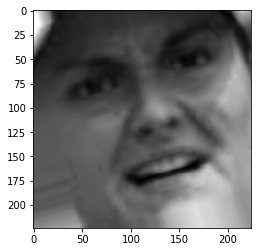

(32, 224, 224, 1)


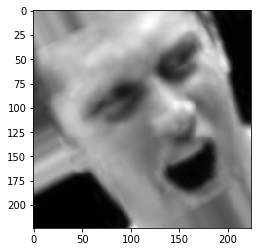

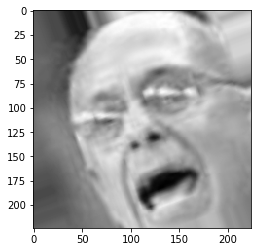

(32, 224, 224, 1)


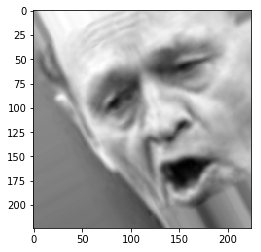

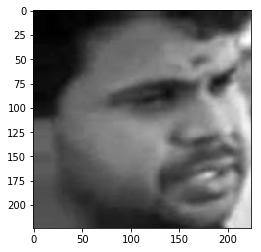

(32, 224, 224, 1)


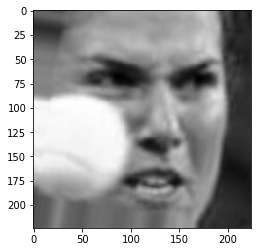

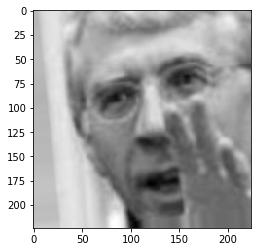

(32, 224, 224, 1)


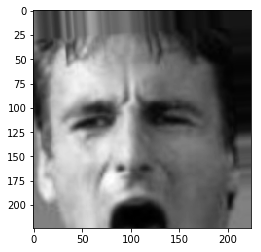

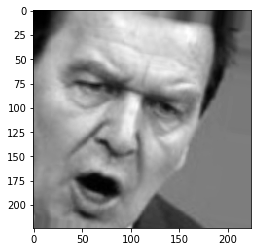

(32, 224, 224, 1)


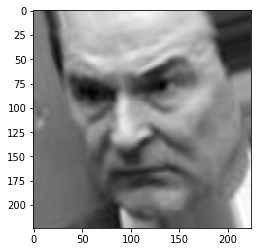

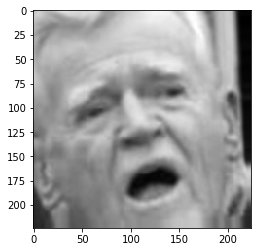

(32, 224, 224, 1)
Epoch 4


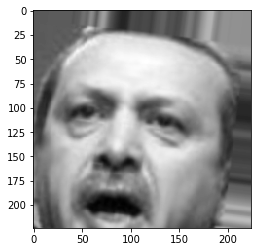

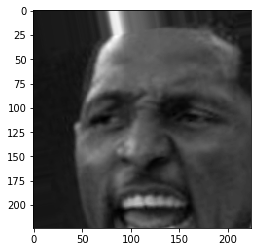

(32, 224, 224, 1)


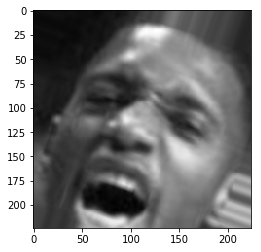

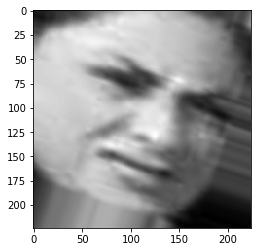

(32, 224, 224, 1)


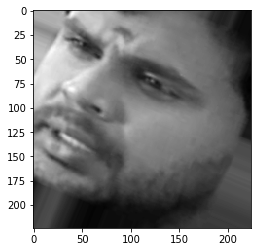

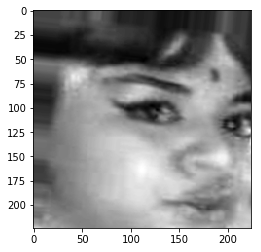

(32, 224, 224, 1)


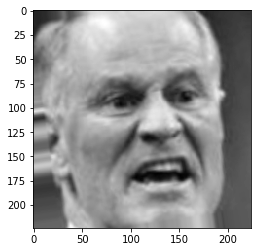

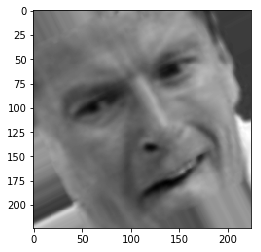

(32, 224, 224, 1)


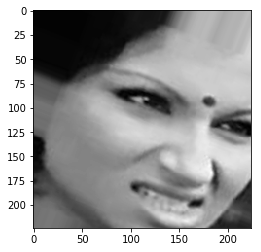

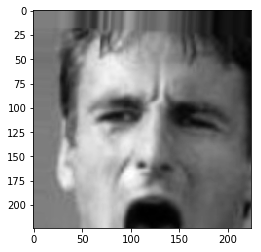

(32, 224, 224, 1)


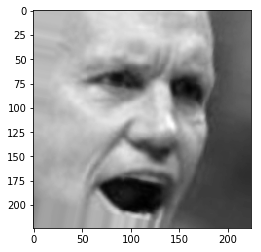

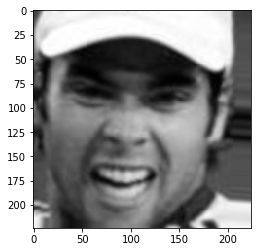

(32, 224, 224, 1)


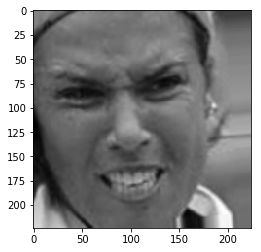

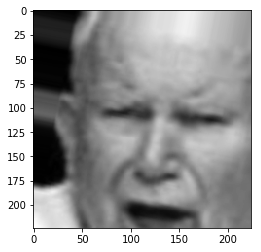

(32, 224, 224, 1)


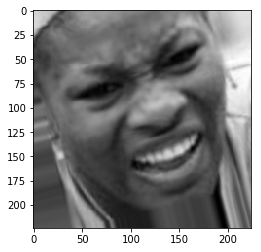

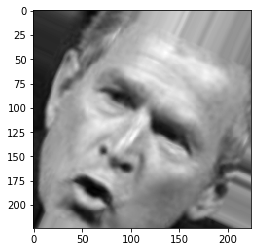

(15, 224, 224, 1)


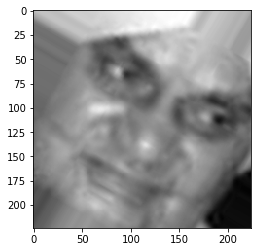

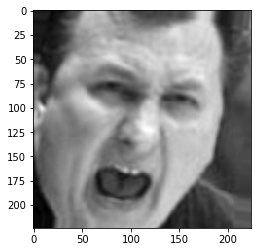

(32, 224, 224, 1)


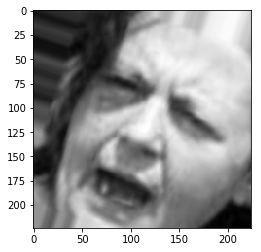

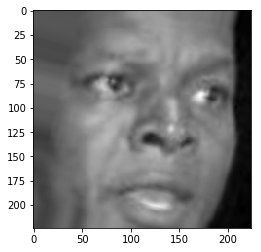

(32, 224, 224, 1)


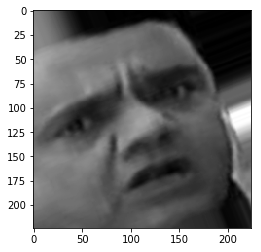

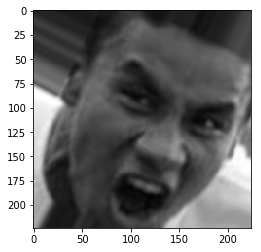

(32, 224, 224, 1)


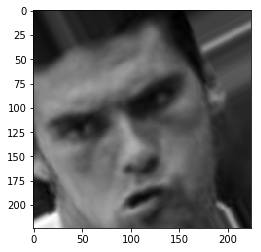

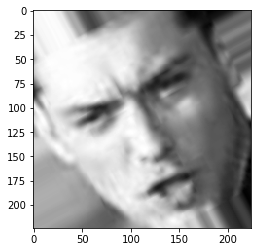

(32, 224, 224, 1)


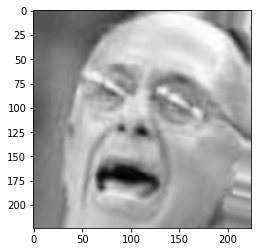

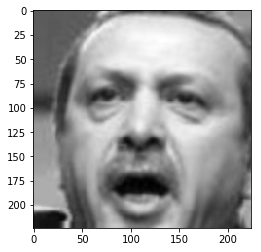

(32, 224, 224, 1)


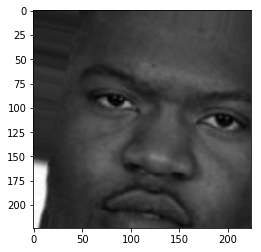

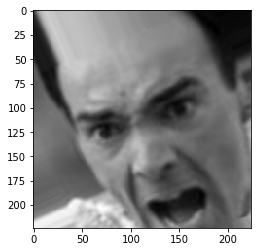

(32, 224, 224, 1)


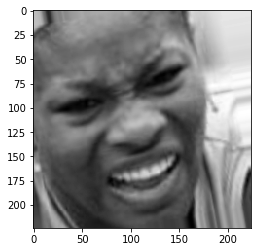

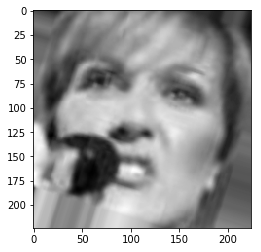

(32, 224, 224, 1)
Epoch 5


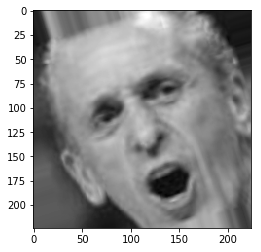

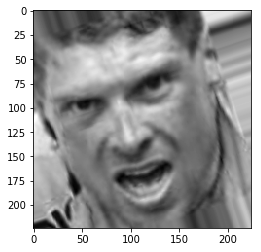

(32, 224, 224, 1)


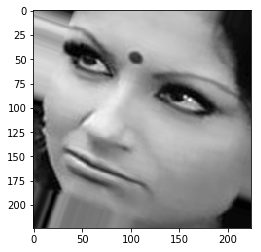

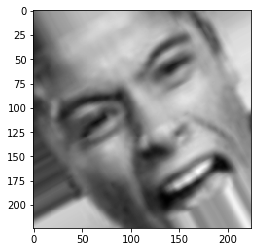

(32, 224, 224, 1)


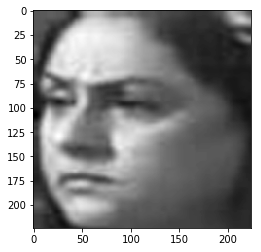

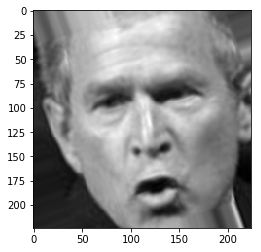

(32, 224, 224, 1)


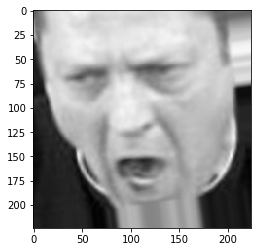

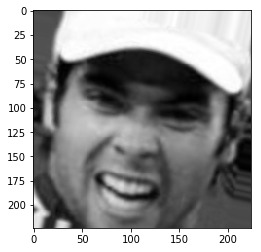

(32, 224, 224, 1)


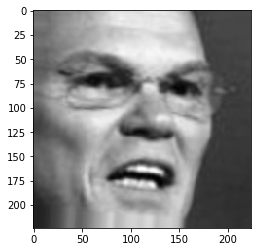

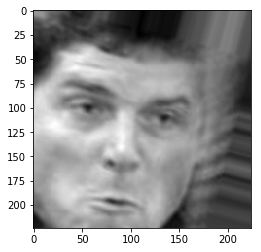

(32, 224, 224, 1)


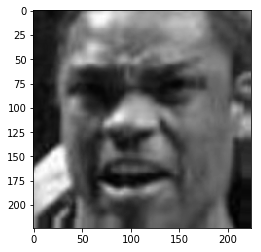

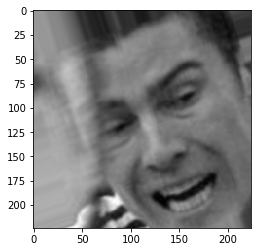

(32, 224, 224, 1)


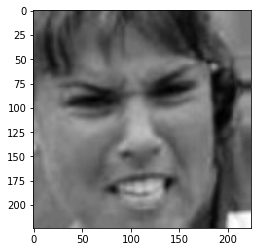

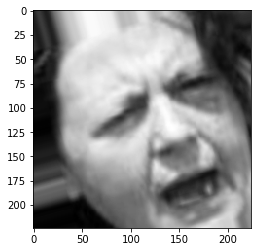

(32, 224, 224, 1)


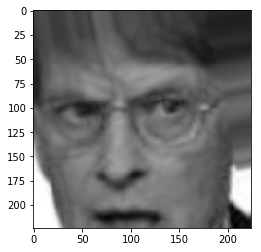

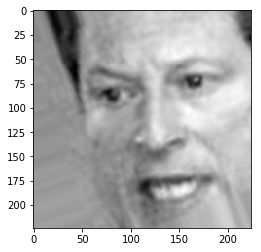

(15, 224, 224, 1)


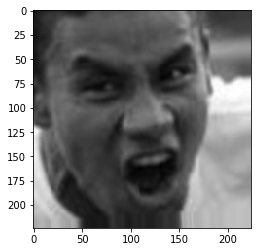

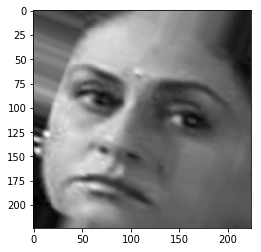

(32, 224, 224, 1)


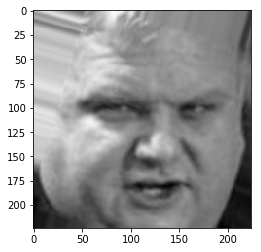

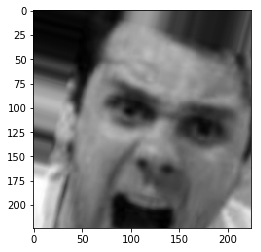

(32, 224, 224, 1)


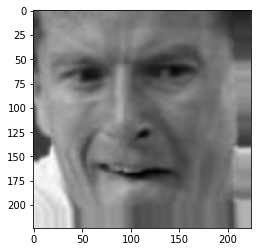

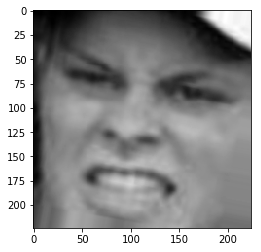

(32, 224, 224, 1)


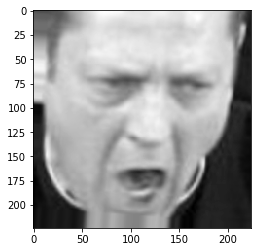

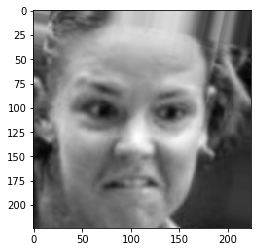

(32, 224, 224, 1)


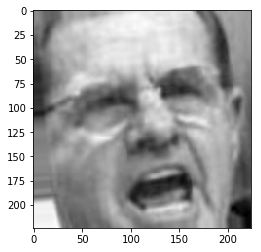

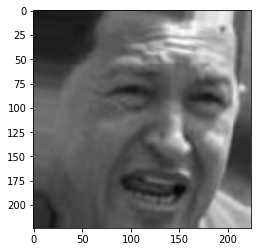

(32, 224, 224, 1)


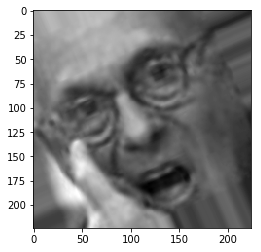

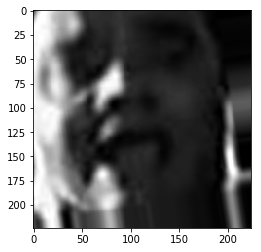

(32, 224, 224, 1)


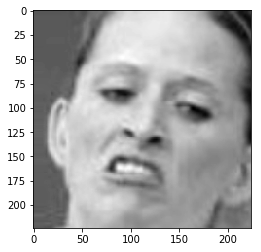

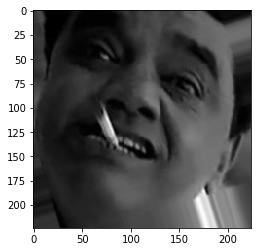

(32, 224, 224, 1)
Epoch 6


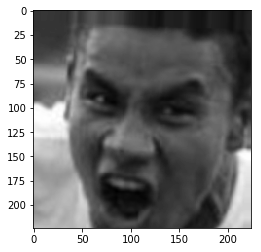

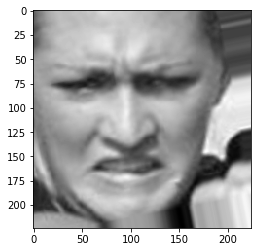

(32, 224, 224, 1)


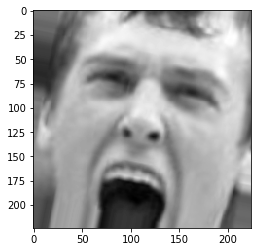

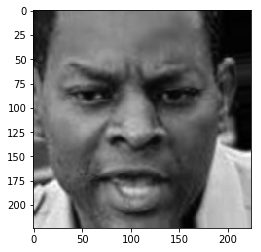

(32, 224, 224, 1)


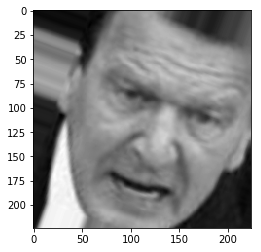

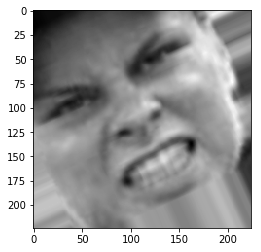

(32, 224, 224, 1)


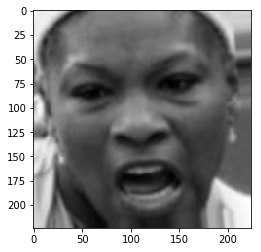

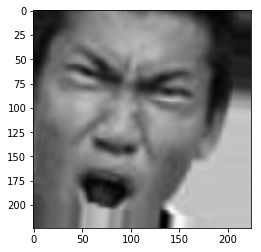

(32, 224, 224, 1)


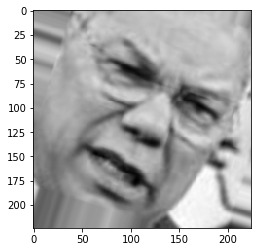

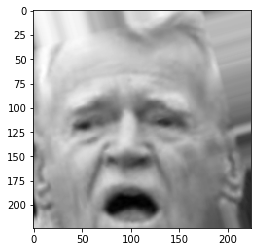

(32, 224, 224, 1)


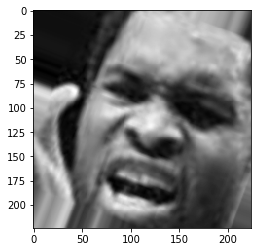

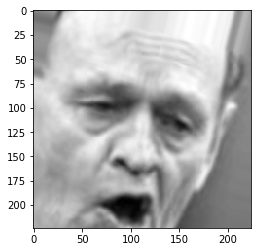

(32, 224, 224, 1)


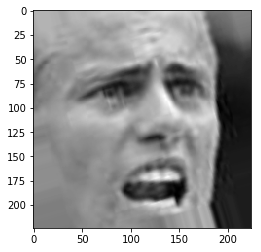

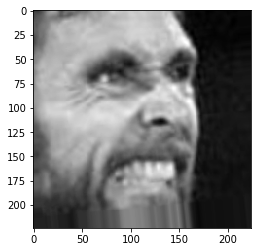

(32, 224, 224, 1)


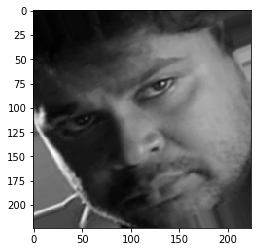

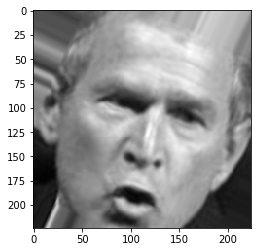

(15, 224, 224, 1)


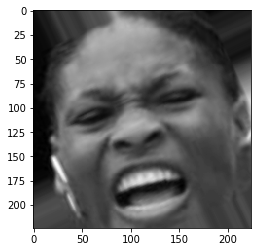

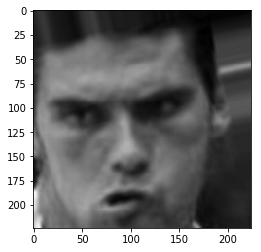

(32, 224, 224, 1)


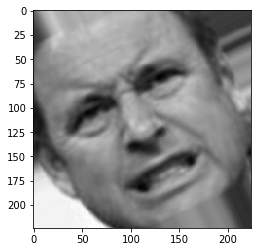

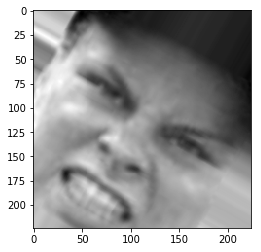

(32, 224, 224, 1)


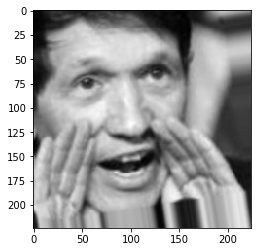

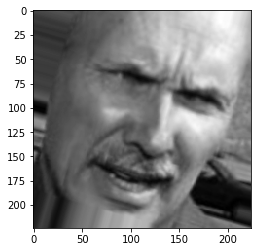

(32, 224, 224, 1)


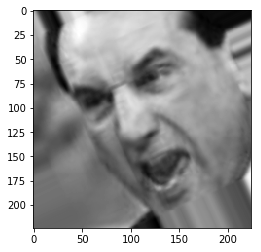

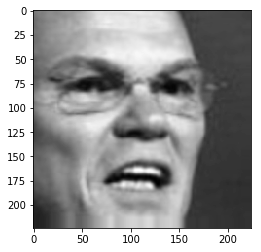

(32, 224, 224, 1)


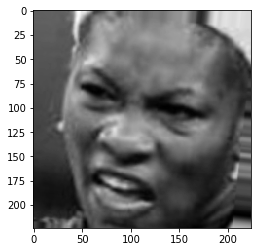

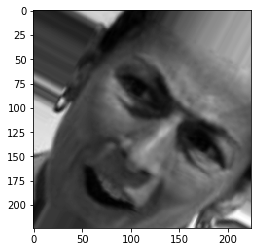

(32, 224, 224, 1)


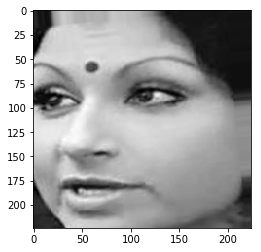

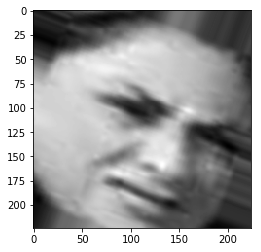

(32, 224, 224, 1)


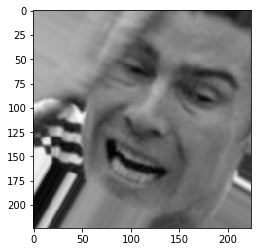

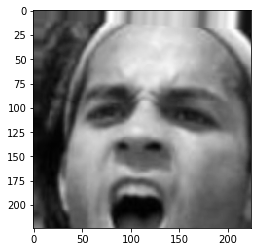

(32, 224, 224, 1)
Epoch 7


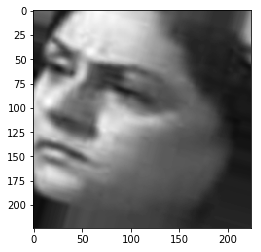

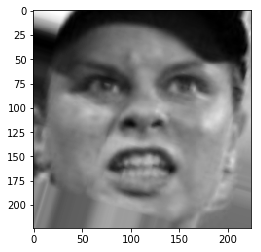

(32, 224, 224, 1)


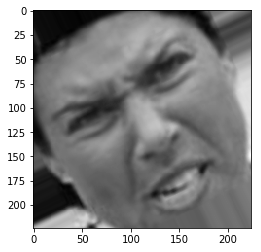

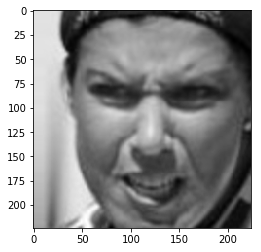

(32, 224, 224, 1)


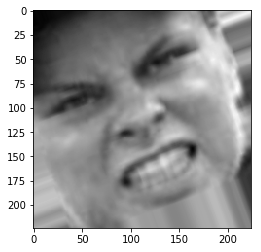

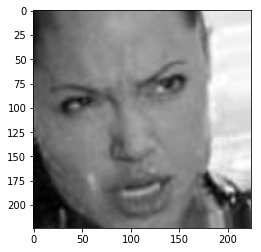

(32, 224, 224, 1)


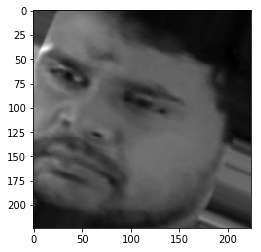

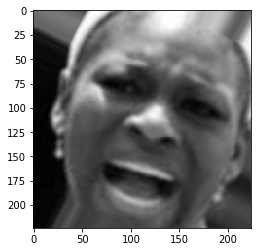

(32, 224, 224, 1)


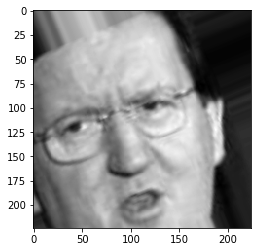

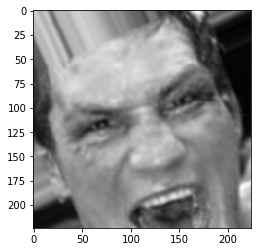

(32, 224, 224, 1)


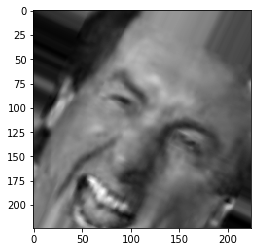

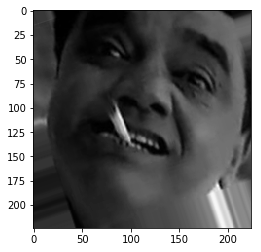

(32, 224, 224, 1)


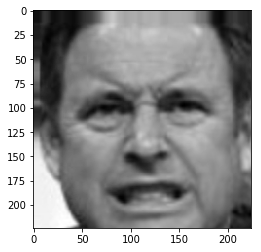

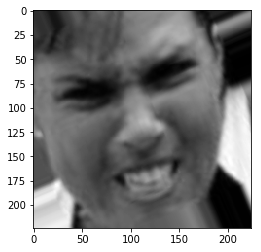

(32, 224, 224, 1)


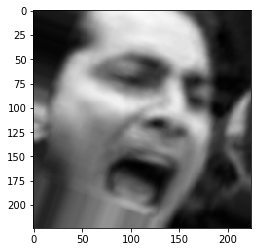

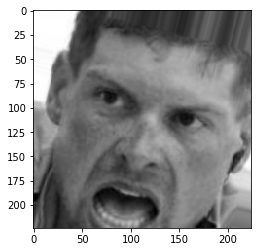

(15, 224, 224, 1)


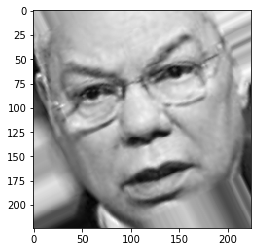

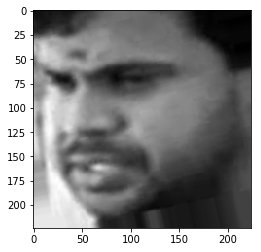

(32, 224, 224, 1)


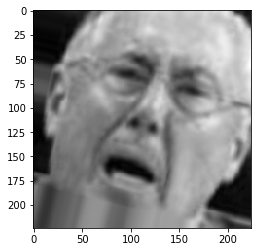

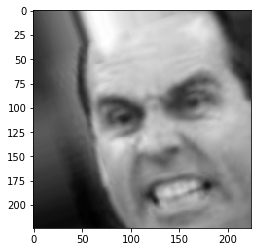

(32, 224, 224, 1)


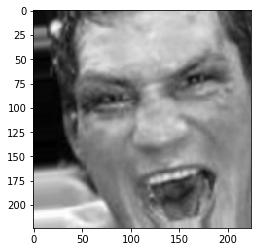

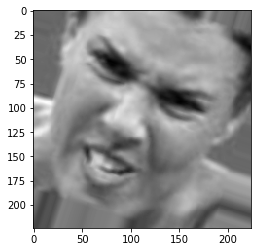

(32, 224, 224, 1)


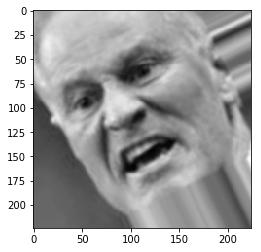

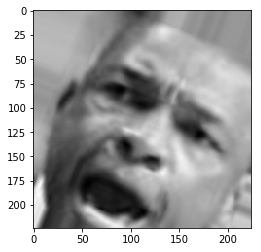

(32, 224, 224, 1)


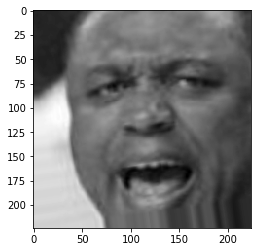

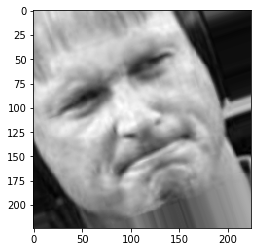

(32, 224, 224, 1)


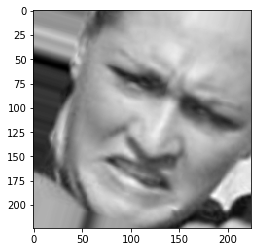

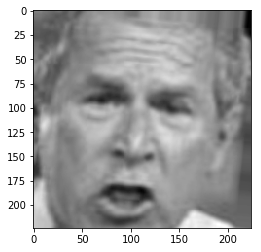

(32, 224, 224, 1)


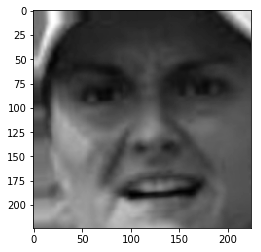

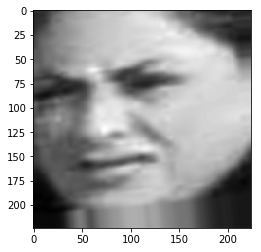

(32, 224, 224, 1)
Epoch 8


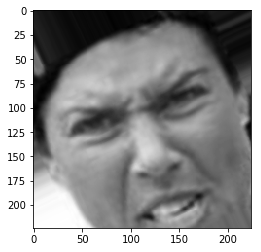

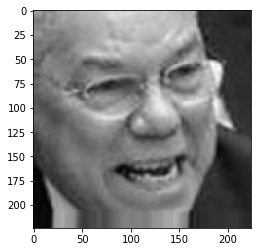

(32, 224, 224, 1)


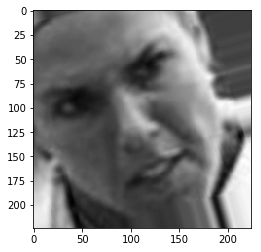

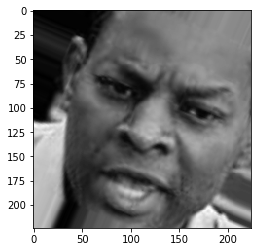

(32, 224, 224, 1)


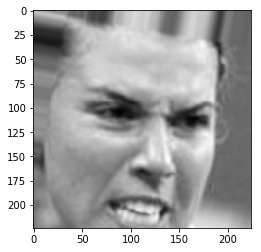

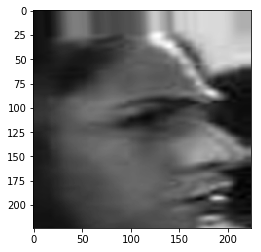

(32, 224, 224, 1)


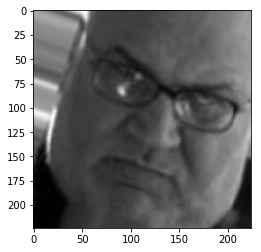

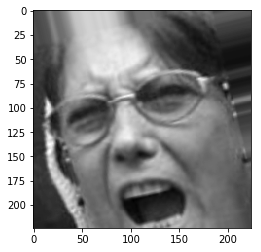

(32, 224, 224, 1)


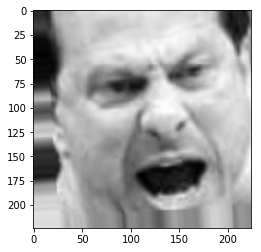

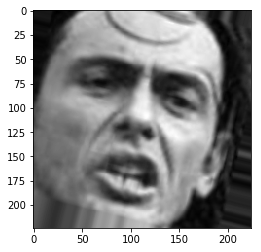

(32, 224, 224, 1)


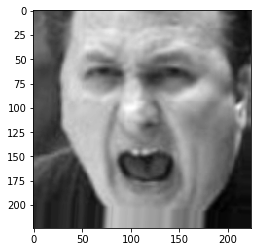

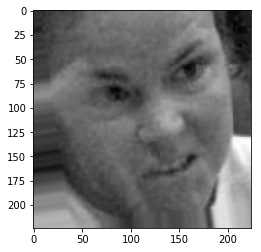

(32, 224, 224, 1)


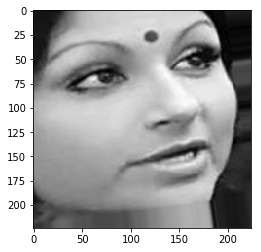

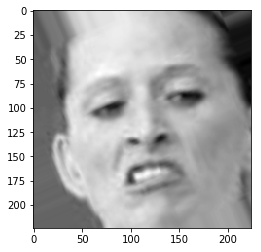

(32, 224, 224, 1)


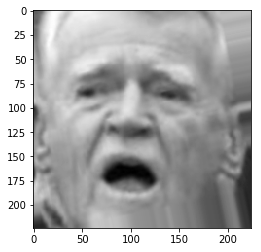

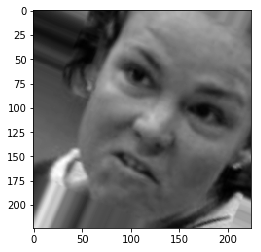

(15, 224, 224, 1)


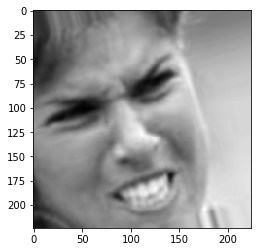

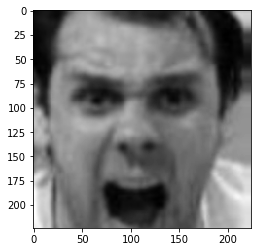

(32, 224, 224, 1)


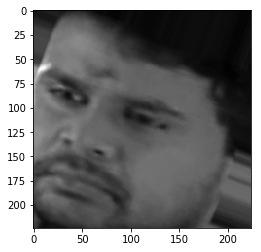

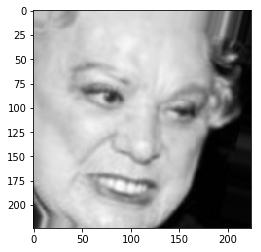

(32, 224, 224, 1)


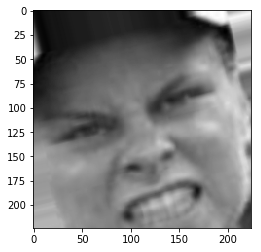

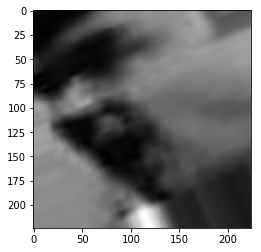

(32, 224, 224, 1)


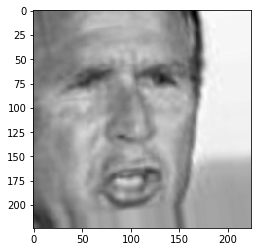

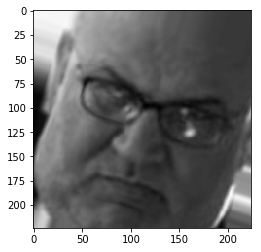

(32, 224, 224, 1)


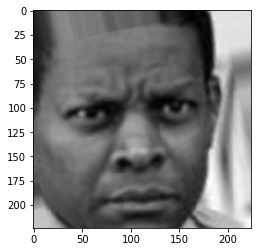

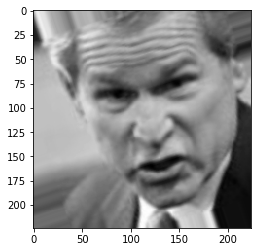

(32, 224, 224, 1)


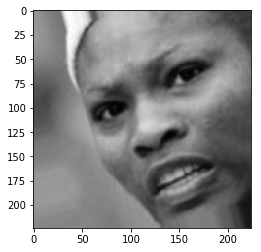

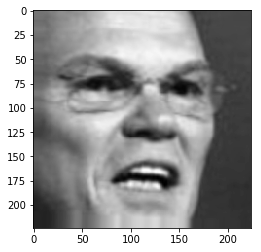

(32, 224, 224, 1)


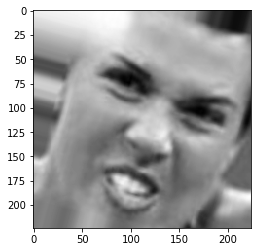

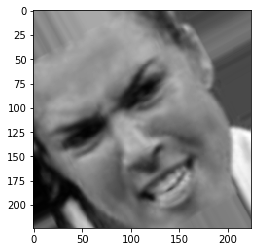

(32, 224, 224, 1)
Epoch 9


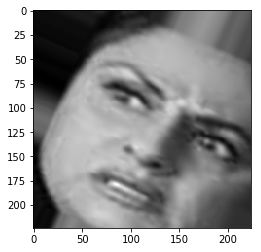

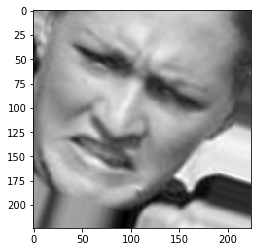

(32, 224, 224, 1)


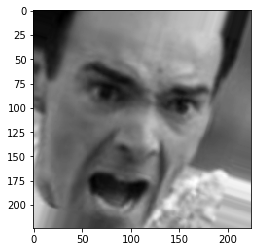

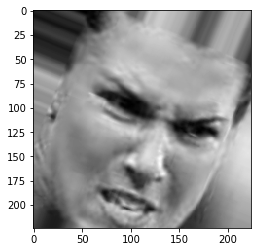

(32, 224, 224, 1)


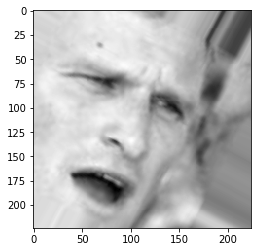

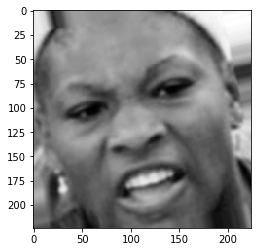

(32, 224, 224, 1)


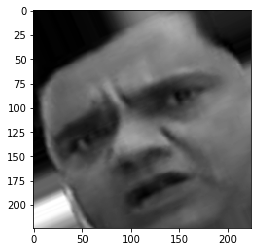

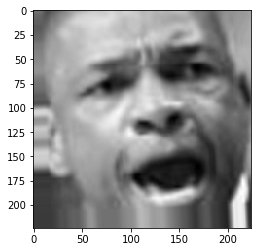

(32, 224, 224, 1)


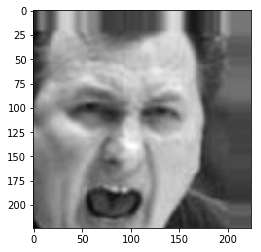

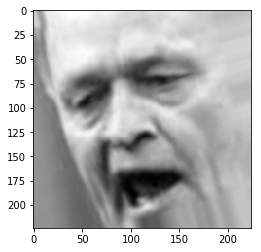

(32, 224, 224, 1)


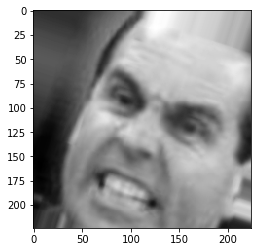

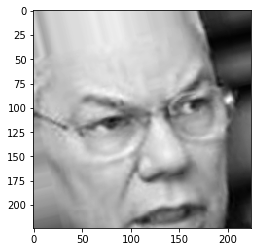

(32, 224, 224, 1)


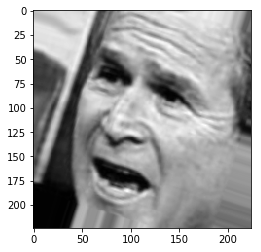

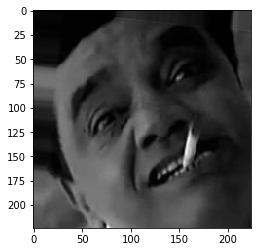

(32, 224, 224, 1)


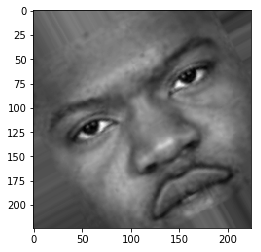

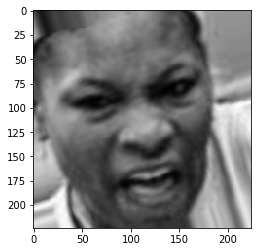

(15, 224, 224, 1)


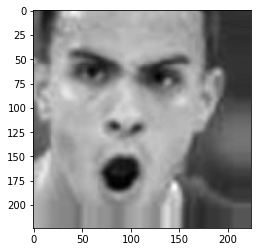

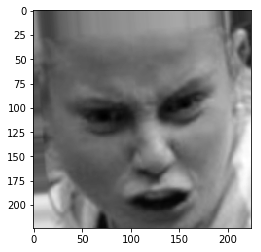

(32, 224, 224, 1)


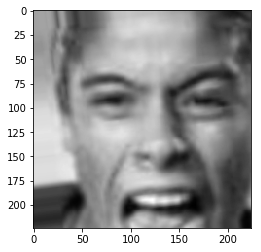

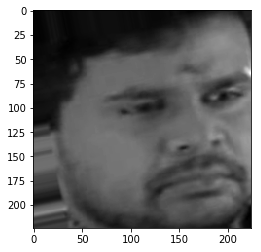

(32, 224, 224, 1)


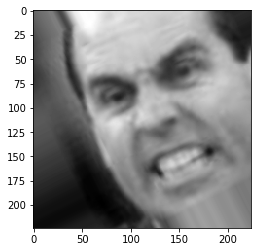

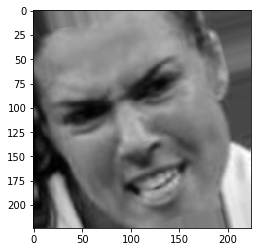

(32, 224, 224, 1)


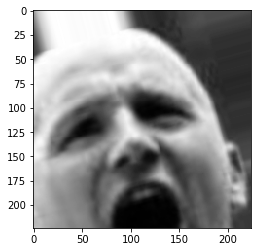

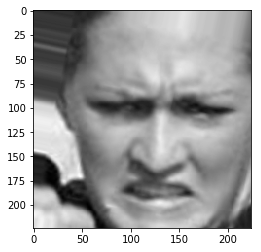

(32, 224, 224, 1)


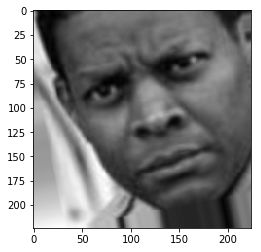

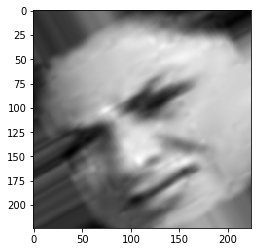

(32, 224, 224, 1)


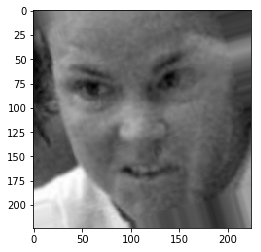

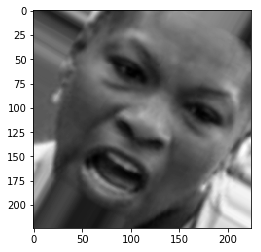

(32, 224, 224, 1)


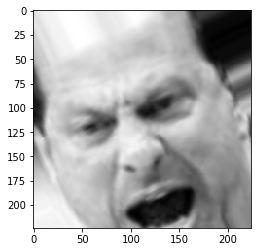

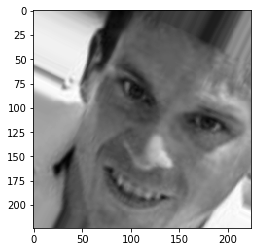

(32, 224, 224, 1)


In [101]:
datagen = ImageDataGenerator(
            rotation_range=30,
            width_shift_range=0.1,
            height_shift_range=0.1,
            shear_range=0.1,
            horizontal_flip=True,
            fill_mode='nearest')
anger_label=np.array((length()))
for e in range(10):
    print('Epoch', e)
    batches = 0
    for x_batch,y_batch in datagen.flow(anger.reshape(len(anger),224,224,1),anger_label, batch_size=32):
    #    model.fit(x_batch, y_batch)
        show_face(x_batch[0].reshape(224,224))
        show_face(x_batch[1].reshape(224,224))
        batches += 1
        print(x_batch.shape)
        if batches >= 15:
            # we need to break the loop by hand because
            # the generator loops indefinitely
            break